# Bar Code Detector
This is the python code to detect barcodes, as of right now it only detects the barcode, (and possibly large boxes of text).

#### Papers
https://pdfs.semanticscholar.org/625d/d30503d2909fbfe0dfa806c9322b3571190a.pdf 


## Utilities

In [55]:
import numpy as np
from numpy import linalg
from skimage import io, filters, feature, morphology, measure
from skimage.color import rgb2gray
import skimage.transform as skt
from scipy import ndimage, signal
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib as mpl
import os
F = False
T = True
from IPython.display import clear_output

### getImageArray
Gets all the images in a folder

In [56]:
#Function to get all images in a folder
def getImageArray(folder):

    files = os.listdir(folder)
    images = []

    # since files will not be in the order I want it in I will set the images to the rigt position
    for f in files:
        tmp = io.imread(folder + "" + f)
        # print(f," : ",tmp.shape)
        images.append(tmp)

    return images

### printImg
Shows all the images in an array

In [57]:
def printImg(imgs):
    j = 1
    for i in imgs:
        plt.imshow(i,cmap='gray')
        plt.axis("off")
        p = "Image " + str(j)
        plt.title(p)
        plt.show()
        j += 1

### bringOut
This will "bring out" the barcodes after the filter and thresholding, this is done by eroding the smaller white spots away then, dilate them afterwards.

In [58]:
def bringOut(img, iter=1):

    erode = morphology.binary_erosion(img)

    for j in range(iter - 1):
        erode = morphology.erosion(erode)

    dil = morphology.binary_dilation(erode)

    for j in range(iter - 1):
        dil = morphology.dilation(dil)

    return dil

### fft

This will filter the image using the kernel in the frquency domain.

In [59]:
def fft(image, kernel):
    imgR, imgC = image.shape[:2]
    kernR, kernC = kernel.shape[:2]
    
    kernPad = np.zeros(image.shape[:2])
    
    sR = (imgR - kernR) // 2
    sC = (imgC - kernC) // 2
    
    kernPad[sR : sR + kernR, sC : sC + kernC] = kernel    

    imgFFT = np.fft.fft2(image)
    kernFFT = np.fft.fft2(kernPad)

    filt = np.fft.fftshift(np.fft.ifft2(imgFFT * kernFFT)) 

    return filt / np.max(filt)

### getGauss
This will get a gaussian kernel for use in filtering.

In [60]:
def getGauss(width,height,sigma):
    tmp = signal.get_window(('gaussian', sigma),width)
    tmp2 = signal.get_window(('gaussian', sigma),height)
    gauss = np.outer(tmp,tmp2)
    
    return gauss

### highPass
This will do a highpass filtering using the fft.

In [61]:
def highPass(img, kernel):
    filt = img/np.max(img) - fft(img,kernel)
    return filt

### largestContour
Use the Shoelace formula to calculate the largest contour by area

In [62]:
def largestContour(conts):

    max = 0
    ind = 0
    # Using the SHoelace formula to calculate area of the contour
    for c in range(len(conts)):
        corners = conts[c]
        n = len(corners)  # of corners
        area = 0.0
        for i in range(n):
            j = (i + 1) % n
            area += corners[i][0] * corners[j][1]
            area -= corners[j][0] * corners[i][1]
        area = abs(area) / 2.0

        if max < area:
            max = area
            ind = c

    return ind

### SobelDetection
Function that uses Sobel filter for barcode detection

In [63]:
def SobelDetection(img, blur=3, bringout=3, v=True):
    cimg = img
    img = rgb2gray(img)

    # Some images respond better with sobel vs sobel vertical
    if v:
        grad = filters.sobel_v(img)
    else:
        grad = filters.sobel(img)

    tmp = grad < 0
    
    grad[tmp] = 0
    
    gauss = filters.gaussian(grad,blur)
    
    fig, ax = filters.try_all_threshold(gauss)
    fig.show()
    plt.show()
    
    clear_output()
    
    plt.imshow(grad,cmap='gray')
    plt.axis("off")
    plt.show()
    
    plt.imshow(gauss,cmap='gray')
    plt.axis("off")
    plt.show()
    
    tmp = filters.threshold_yen(gauss)
    
    tmp1 = gauss
    th = gauss >= tmp
    
    tmp1[th] = 1
    
    th = gauss < tmp
    
    tmp1[th] = 0
    
    dil = bringOut(tmp1, bringout)
    
    plt.imshow(dil,cmap='gray')
    plt.axis("off")
    plt.show()
    
    cont = measure.find_contours(dil)
    
    # Display the image and plot all contours found
    fig, ax = plt.subplots()
    ax.imshow(cimg)
    
    ind = largestContour(cont)
        
    for n, cont in enumerate(cont):
        if n == ind:
            ax.plot(cont[:, 1], cont[:, 0], linewidth=4, color = 'r')
    
    ax.axis('image')
    ax.set_xticks([])
    ax.set_yticks([])
    plt.show()

### LaplaceDetection
Function that uses Laplace filter for barcode detection

In [64]:
def LaplaceDetection(img, blur=3):
    cimg = img
    img = rgb2gray(img)
    grad = filters.laplace(img)
    
    tmp = grad < 0
    
    grad[tmp] = 0
    
    gauss = filters.gaussian(grad,blur)
    
    fig, ax = filters.try_all_threshold(gauss)
    fig.show()
    plt.show()
    
    clear_output()
    
    plt.imshow(grad,cmap='gray')
    plt.axis("off")
    plt.show()
    
    plt.imshow(gauss,cmap='gray')
    plt.axis("off")
    plt.show()
    
    tmp = filters.threshold_yen(gauss)
    
    tmp1 = gauss
    th = gauss >= tmp
    
    tmp1[th] = 1
    
    th = gauss < tmp
    
    tmp1[th] = 0
    
    plt.imshow(tmp1,cmap='gray')
    plt.axis("off")
    plt.show()
    
    cont = measure.find_contours(tmp1)
    
    # Display the image and plot all contours found
    fig, ax = plt.subplots()
    ax.imshow(cimg)
    
    ind = largestContour(cont)
    
    for n, cont in enumerate(cont):
        if n == ind:
            ax.plot(cont[:, 1], cont[:, 0], linewidth=4, color = 'r')
    
    ax.axis('image')
    ax.set_xticks([])
    ax.set_yticks([])
    plt.show()

### FFTDetection
Function that uses FFT to view areas of high frequency which may be barcodes.

In [65]:
def FFTDetection(img, blur=3):
    cimg = img
    img = rgb2gray(img)
    
    kern = getGauss(75,75,.5)
    
    filt = np.real(highPass(img,kern))
    
    tmp = filt < 0
    
    filt[tmp] = 0
    
    gauss = filters.gaussian(filt,blur)
    
    fig, ax = filters.try_all_threshold(gauss)
    
    fig.show()
    plt.axis("off")
    plt.show()
    
    clear_output()
    
    plt.imshow(filt,cmap='gray')
    plt.axis("off")
    plt.show()
    
    plt.imshow(gauss,cmap='gray')
    plt.axis("off")
    plt.show()
    
    
    tmp = filters.threshold_yen(gauss)
    
    tmp1 = gauss
    th = gauss >= tmp
    
    tmp1[th] = 1
    
    th = gauss < tmp
    
    tmp1[th] = 0
    
    plt.imshow(tmp1,cmap='gray')
    plt.axis("off")
    plt.show()
    
    cont = measure.find_contours(tmp1, .9)
    
    # Display the image and plot all contours found
    fig, ax = plt.subplots()
    ax.imshow(cimg)
 
    ind = largestContour(cont)
    
    for n, cont in enumerate(cont):
        if n == ind:
            ax.plot(cont[:, 1], cont[:, 0], linewidth=4, color = 'r')
    
    ax.axis('image')
    ax.set_xticks([])
    ax.set_yticks([])
    plt.show()



# HoughDetector
Using the paper mentioned to detect barcodes

In [66]:
def HoughDetector(img, sig=2, min_dist=50,min_ang=60):    
    cimg = img
    image = rgb2gray(img)
    edge = feature.canny(image,sigma=sig)
    plt.imshow(edge,cmap='gray')
    plt.title("Canny Edge of image")
    plt.axis("off")
    plt.show()
    
    h, theta, d = skt.hough_line(edge)
    plt.title("Hough Space")
    plt.axis("off")
    plt.imshow(h,cmap='plasma')
    plt.show()
    
    plt.imshow(edge, cmap='gray')
    origin = np.array((0, image.shape[1]))
    for _, angle, dist in zip(*skt.hough_line_peaks(h, theta, d,min_distance=50,min_angle=60)):
        y0, y1 = (dist - origin * np.cos(angle)) / np.sin(angle)
        plt.plot(origin, (y0, y1), '-r')
        
    plt.xlim(origin)
    plt.ylim((image.shape[0], 0))
    plt.axis('off')
    plt.title('Detected lines')
    plt.show()


## Images
I pulled all these images from Google, I wanted to get some variety in the images so I can test if i can get a transform invarient method of detecting barcodes. Images 1, 2, and 5 I expect to give me problems since the barcode is partially covered (image 5) or there is other stuff in the image that could be taken as barcodes like text or in image 1 the nutrition facts.

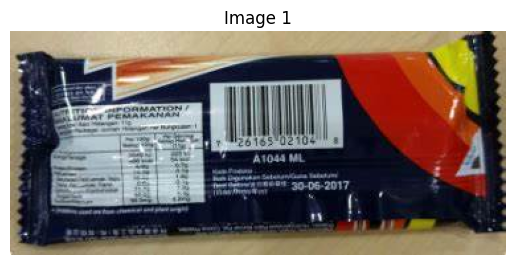

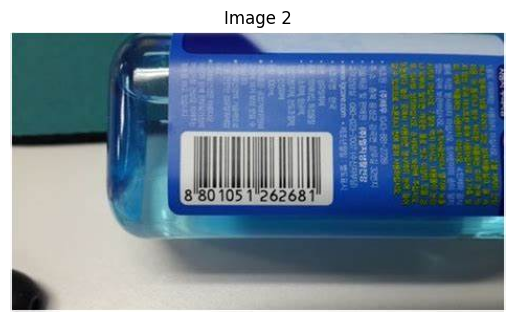

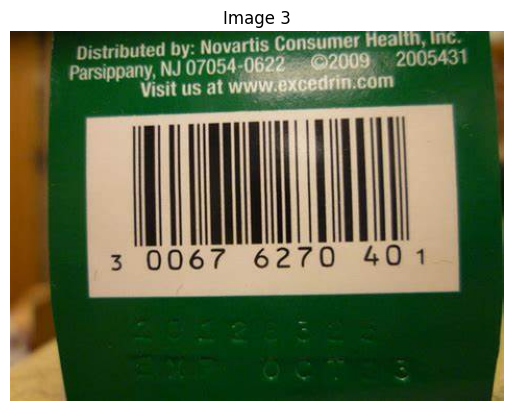

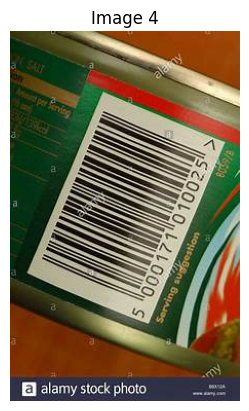

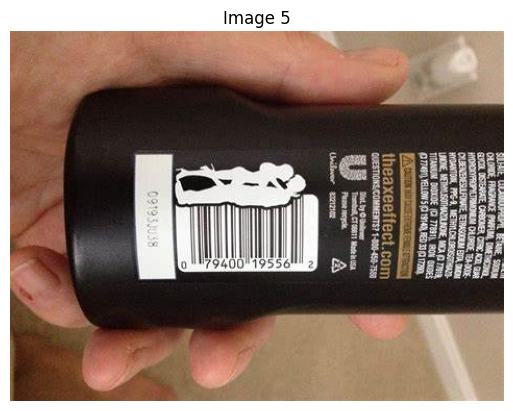

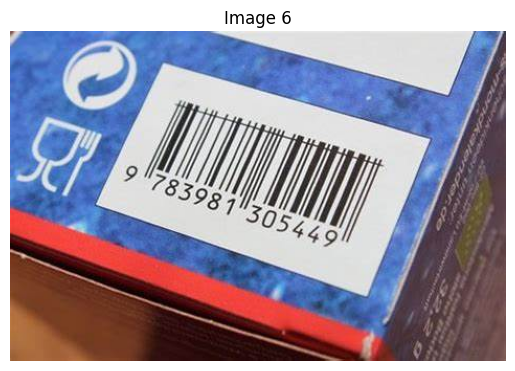

In [67]:
imgs = getImageArray("./Data/Barcodes/")
printImg(imgs)


# Edge Detection
First I wanted to try some edge detecting filters since barcodes are just lines, since I have varied images and they are not perfect I need to use an edge detector that will work with both horizontal and vertical edges or a mixture of both.

## Sobel
I started off with a sobel filter for no particular reason other than its an option.\
My process:
1. Sobel Filter the image
2. Gaussian Blur
3. Threshold the image to make it binary
4. Erode and Dilate the image to "bring out" areas where there are many edges
5. Find the contours of the parts of the image from the previous section
6. Display

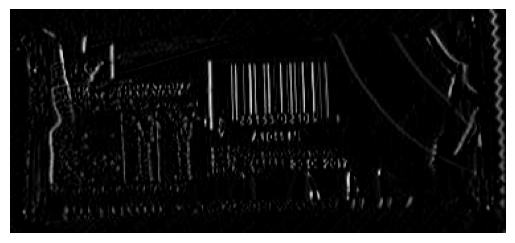

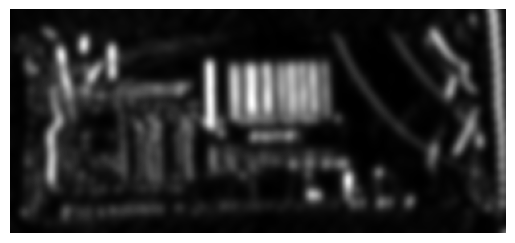

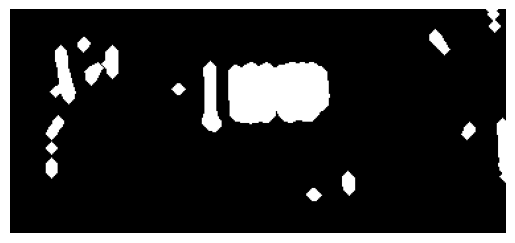

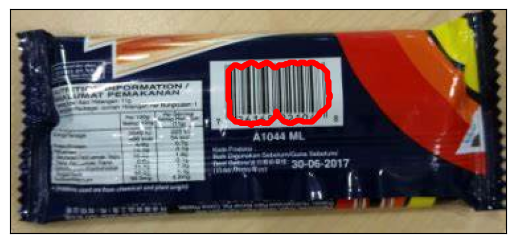

In [68]:
SobelDetection(imgs[0],3,4)

Although this image has a large amount of noise, the barcode was still detected.

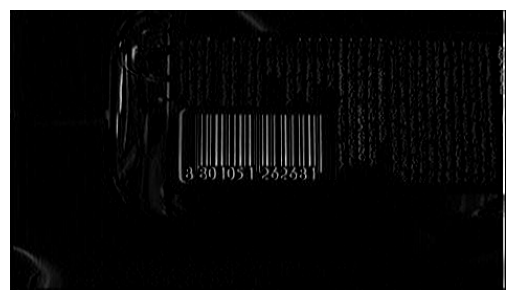

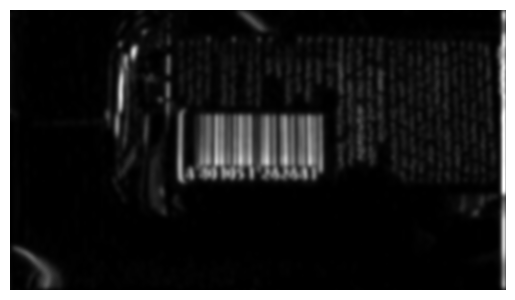

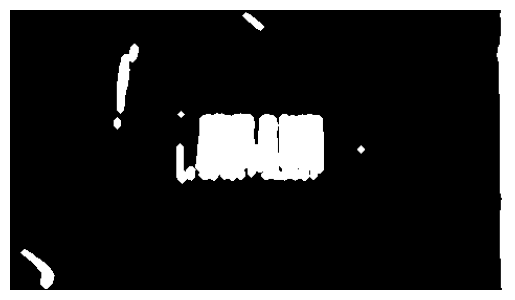

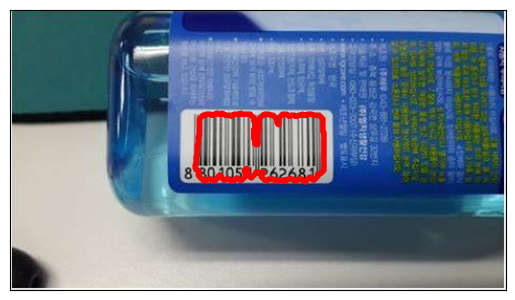

In [69]:
#Image 2
SobelDetection(imgs[1],2)

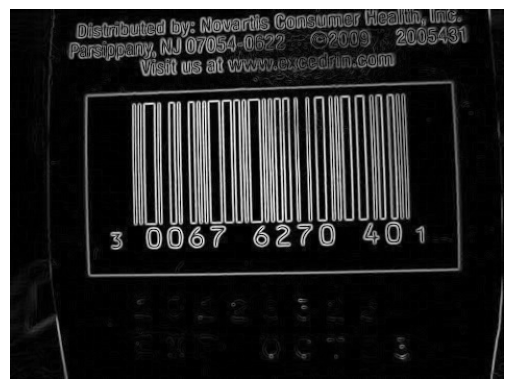

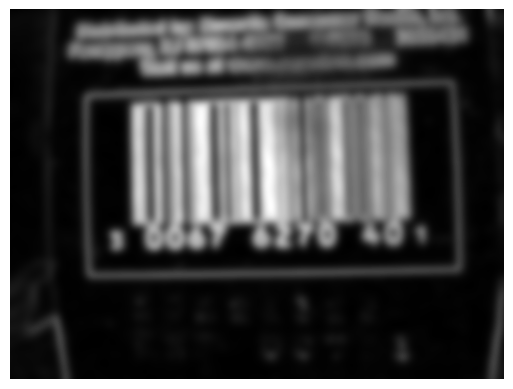

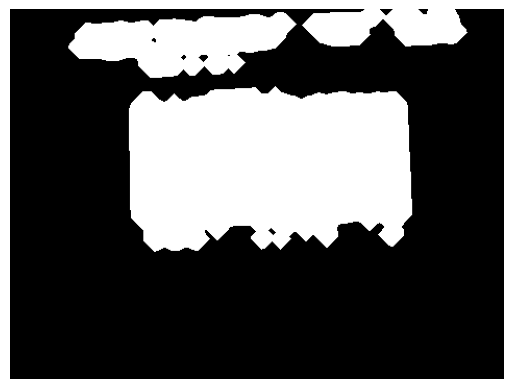

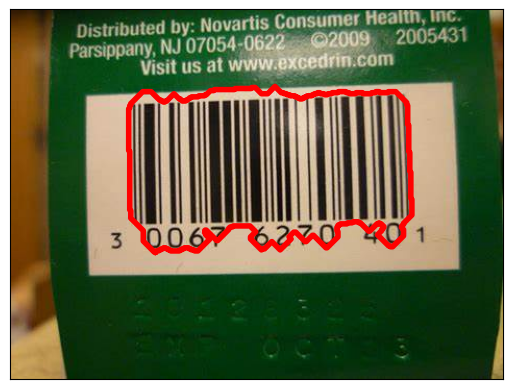

In [70]:
#Image 3
SobelDetection(imgs[2],4,10,False)

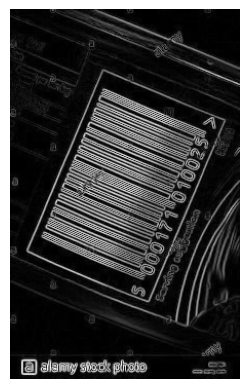

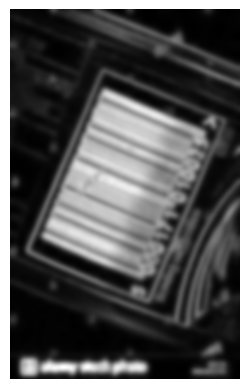

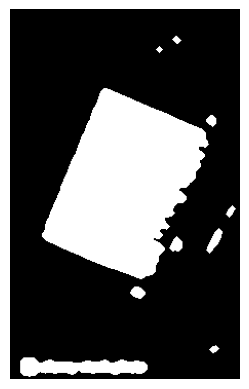

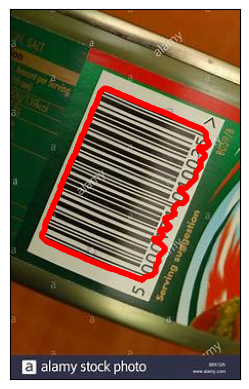

In [71]:
#Image 4
SobelDetection(imgs[3],2.5,3,False)

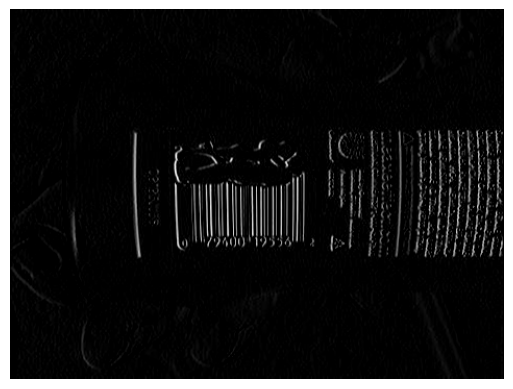

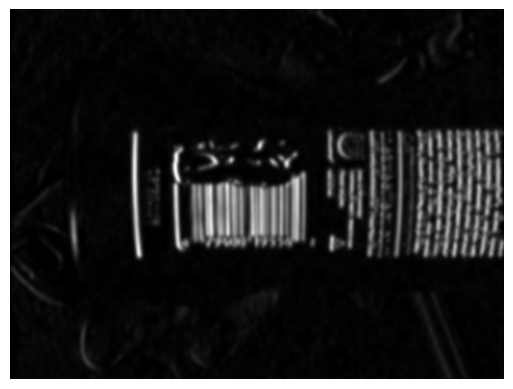

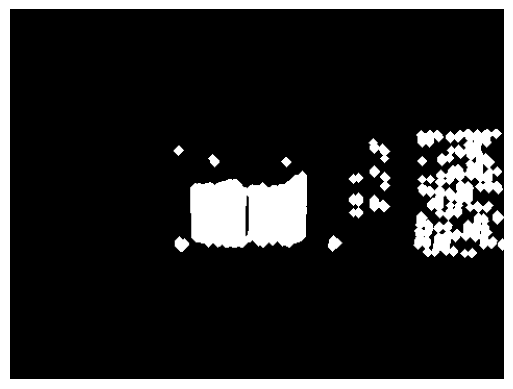

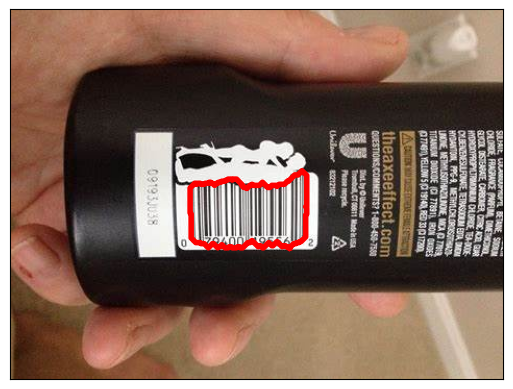

In [72]:
#Image 5
SobelDetection(imgs[4],1.75,4,True)

This image has a large chunk of text and a partially blocked barcode, this leads to extreme noise and a difficult image to detect. However, still obtainable.

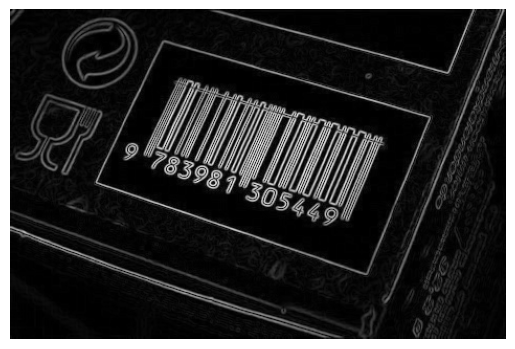

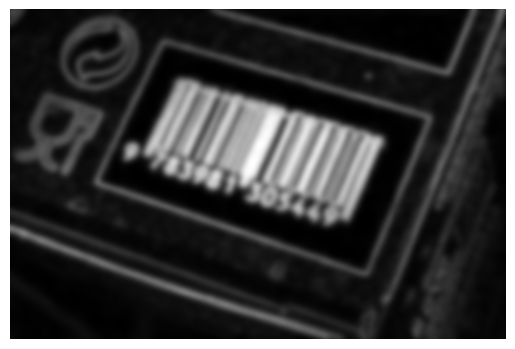

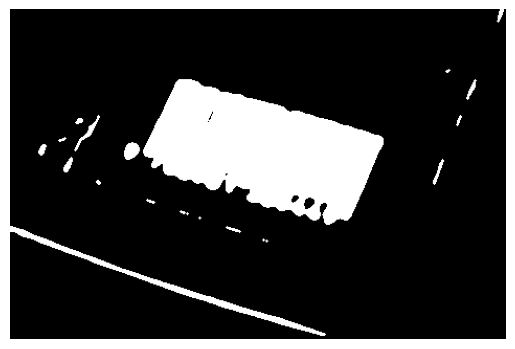

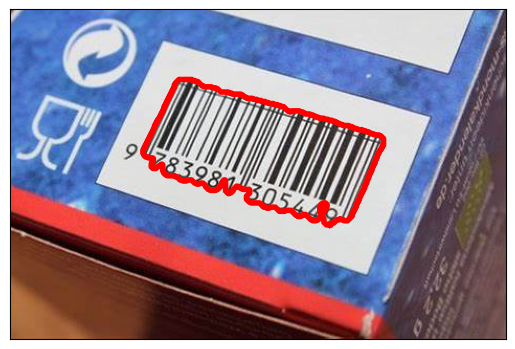

In [73]:
#Image 6
SobelDetection(imgs[5],3,1,False)

Some problems I came across was how I decided which contour region was the barcode, I simply used the largest region, I could improve this by checking the region and choosing the most rectangular.


## Laplace 
1. Laplace Filter the image
2. Gaussian Blur
3. Threshold the image to make it binary
4. Find the contours of the parts of the image from the previous section
5. Display


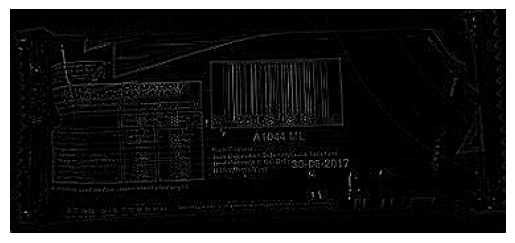

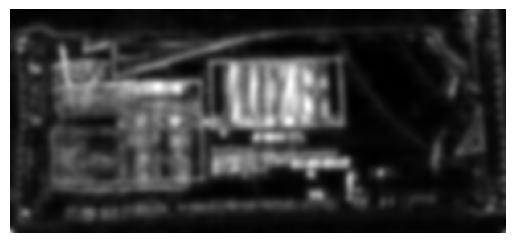

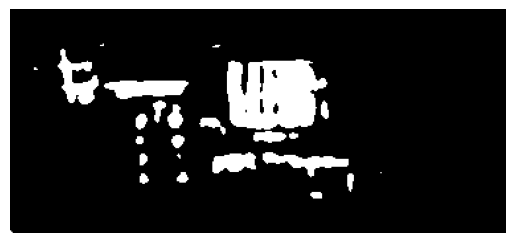

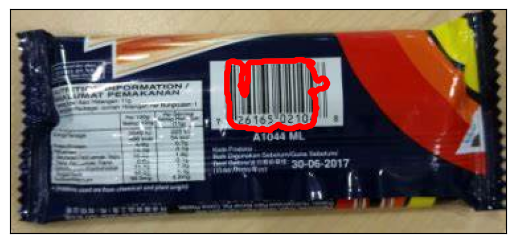

In [74]:
#Image 1
LaplaceDetection(imgs[0],2.5)

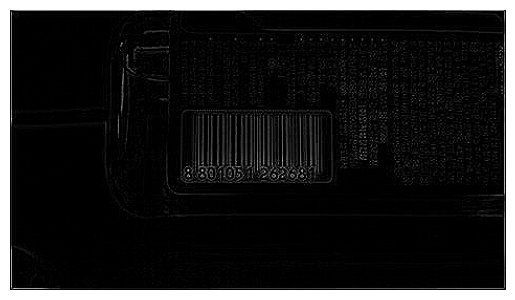

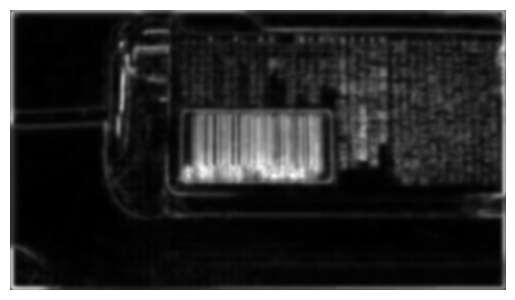

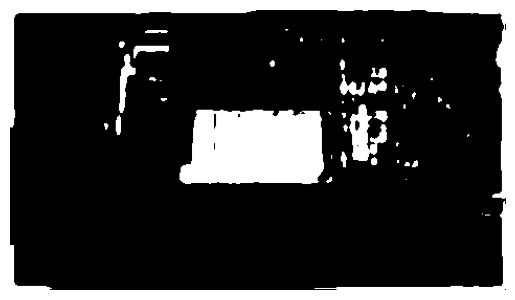

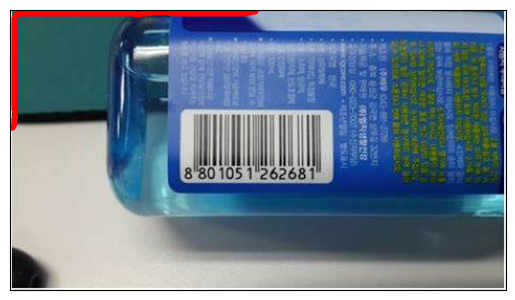

In [75]:
#Image 2
LaplaceDetection(imgs[1],2)

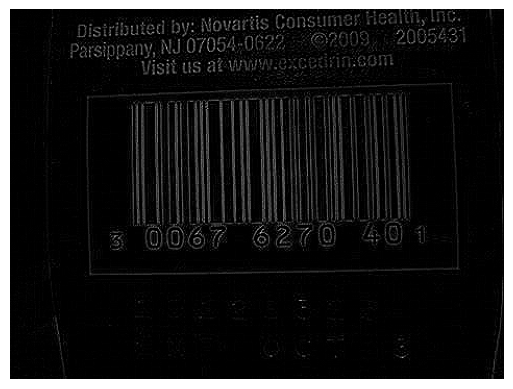

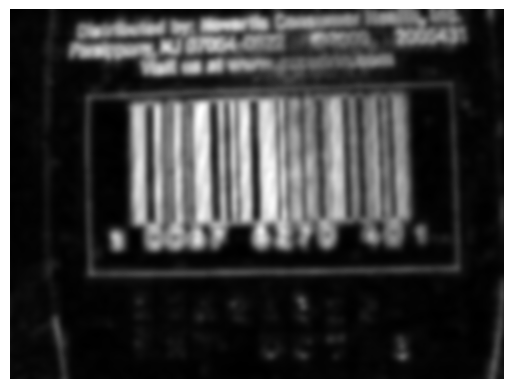

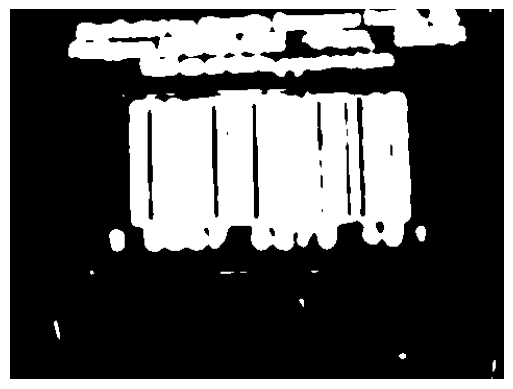

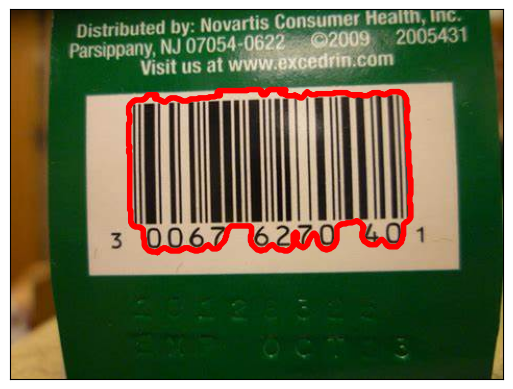

In [76]:
#Image 3
LaplaceDetection(imgs[2],3)

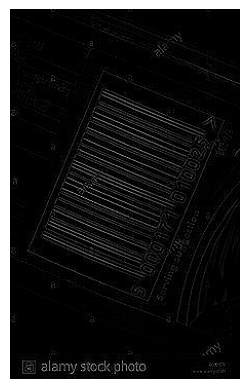

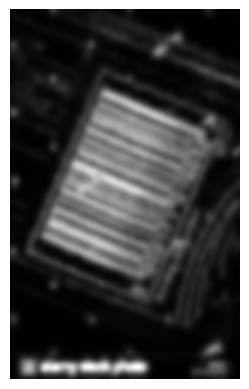

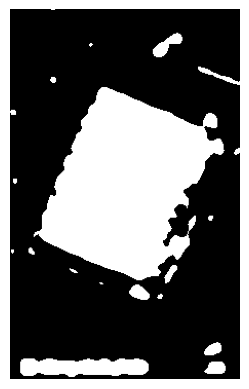

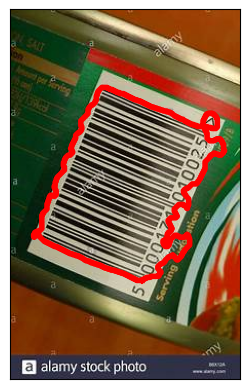

In [77]:
#Image 4
LaplaceDetection(imgs[3],3)

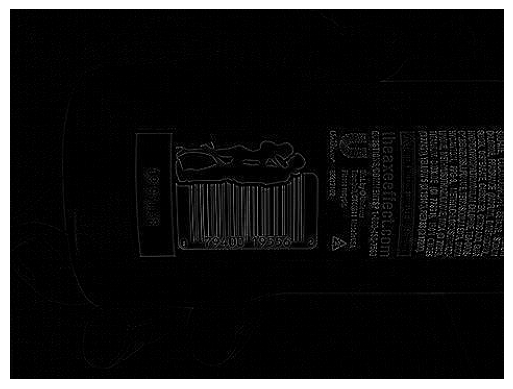

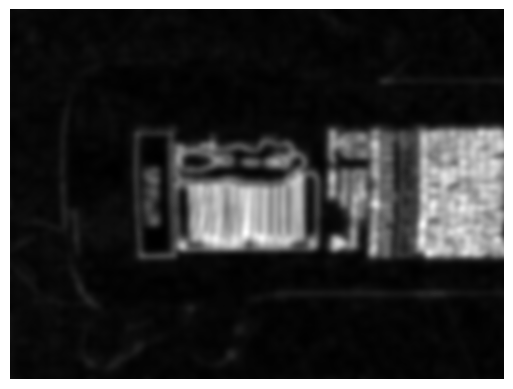

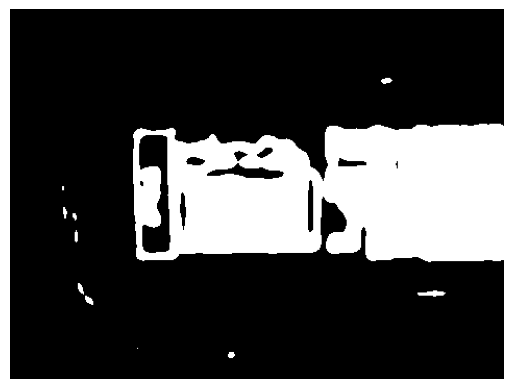

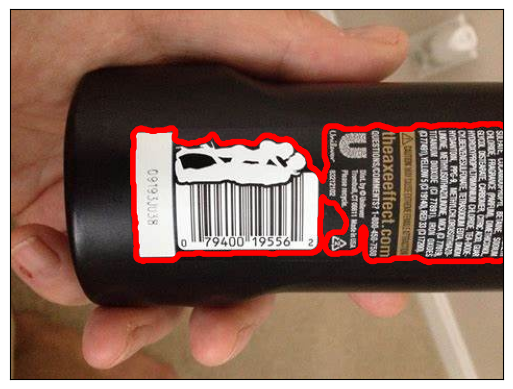

In [78]:
#Image 5
LaplaceDetection(imgs[4],3)

This one sadly will get the text even if I do the "get rectangular contour" but I do have the barcode as an option to choose, maybe having a template filter after this might help.

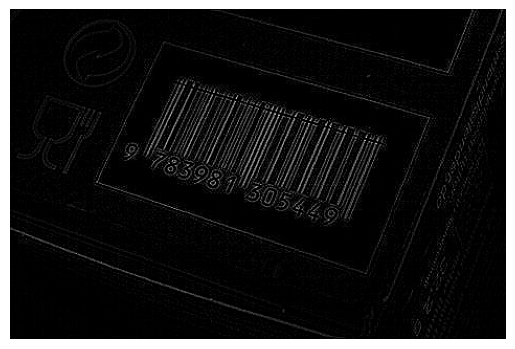

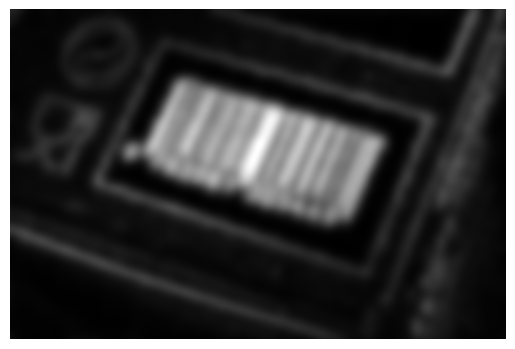

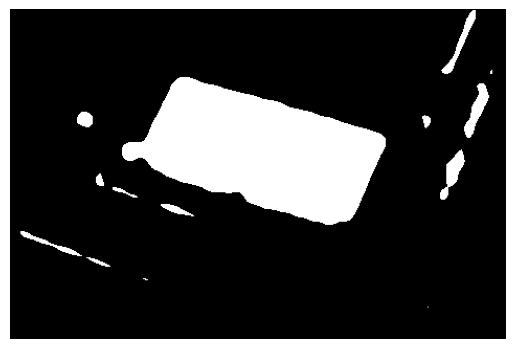

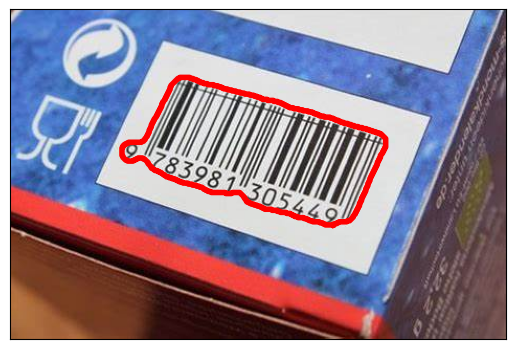

In [79]:
#Image 6
LaplaceDetection(imgs[5],5)

# FFT
Since barcodes would have high frequency I wanted to see how well an FFT.
Process:\
1. FFT the image
2. High pass filter
3. Blur
5. Get contours
6. Display

This is mostly just the same as the above just another method so I will only do some images.

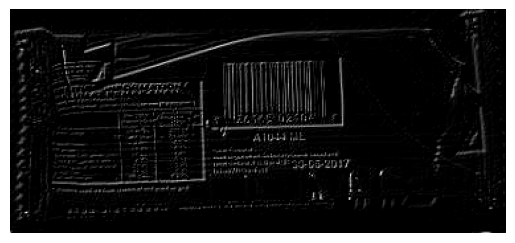

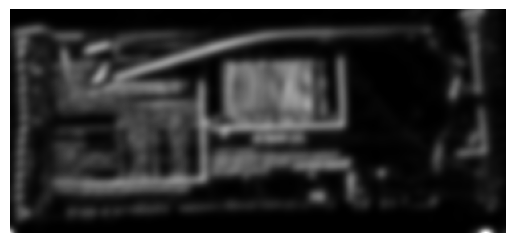

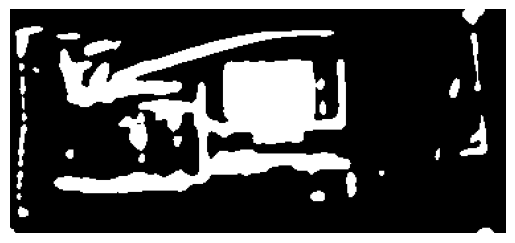

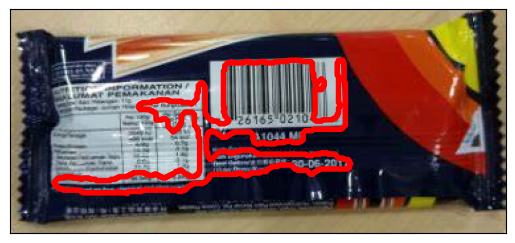

In [80]:
#Image 1
FFTDetection(imgs[0], blur=3)

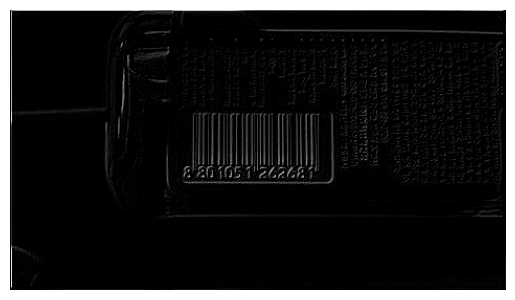

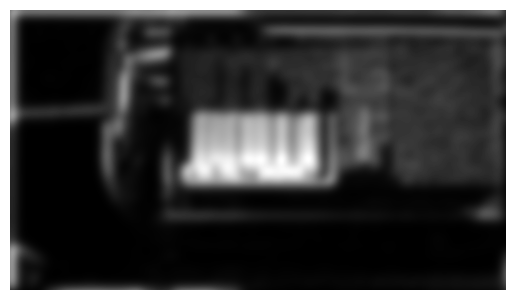

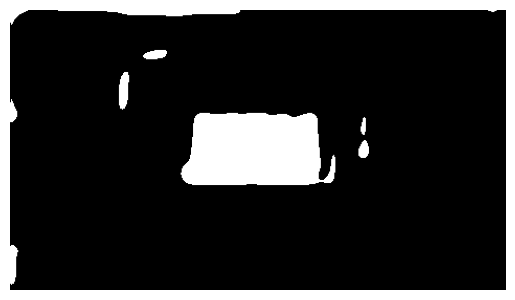

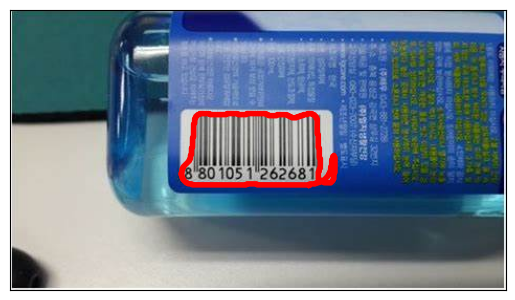

In [81]:
#Image 2
FFTDetection(imgs[1], blur=5)

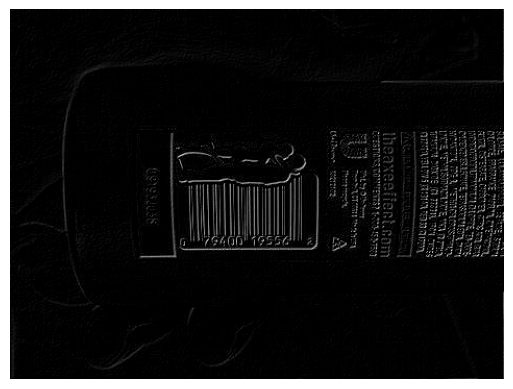

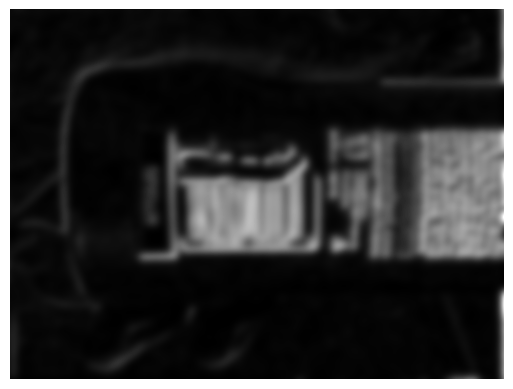

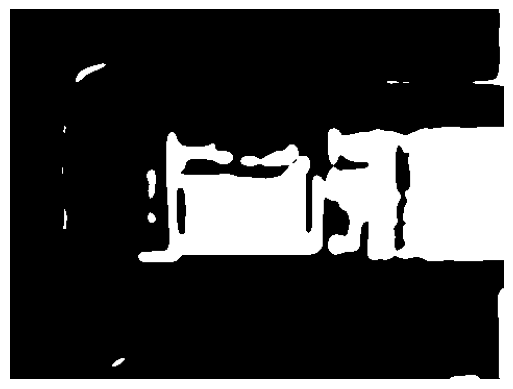

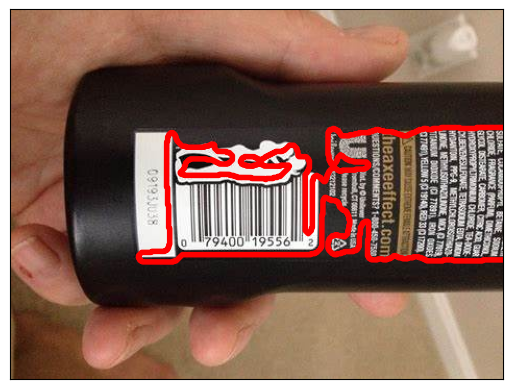

In [82]:
#Image 5
FFTDetection(imgs[4], blur=4)

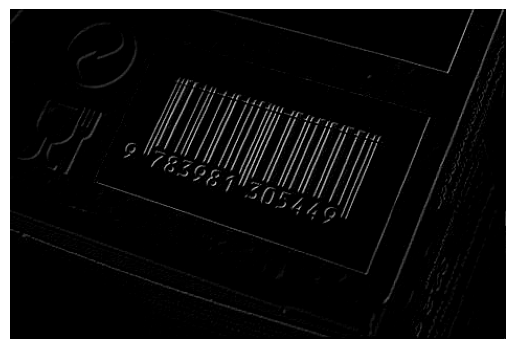

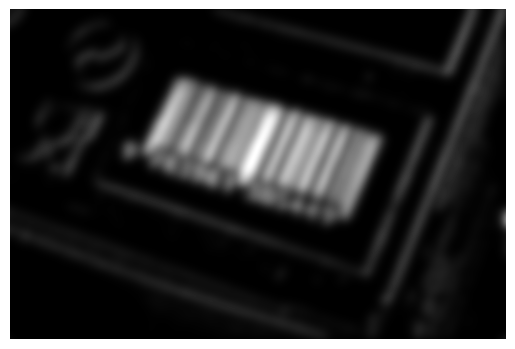

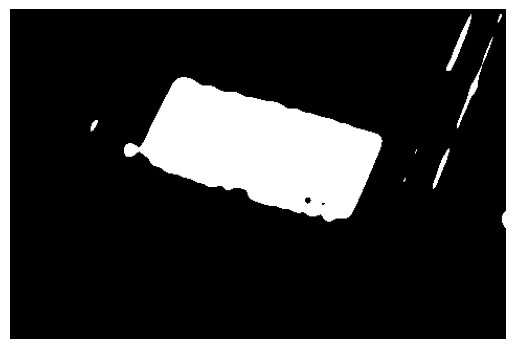

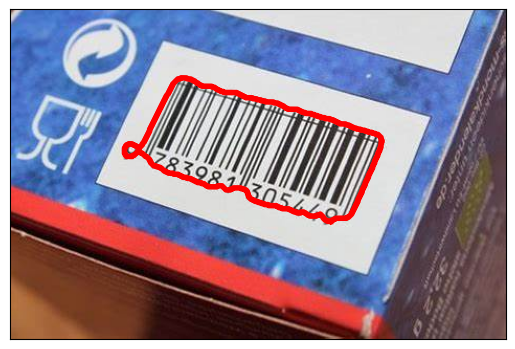

In [83]:
#Image 6
FFTDetection(imgs[5], blur=5)

# Hough Transform
Here I follow the paper to see how I do.

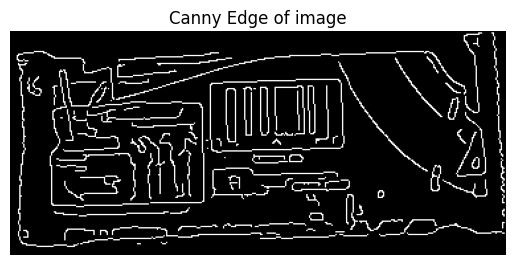

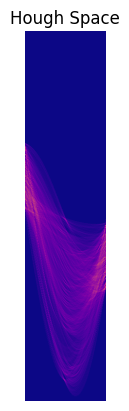

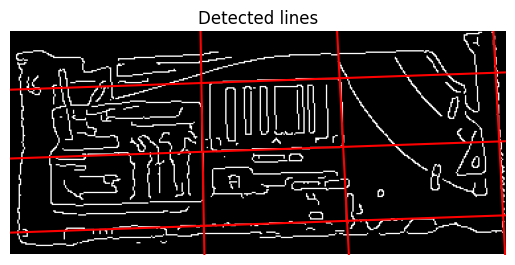

In [84]:
#Image 1
HoughDetector(imgs[0])

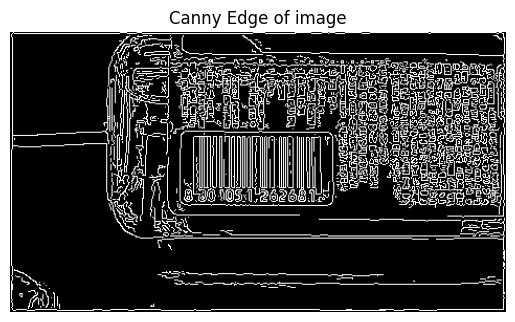

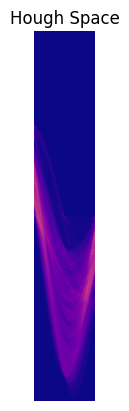

/tmp/ipykernel_63995/2893230468.py:19: RuntimeWarning: divide by zero encountered in divide
  y0, y1 = (dist - origin * np.cos(angle)) / np.sin(angle)


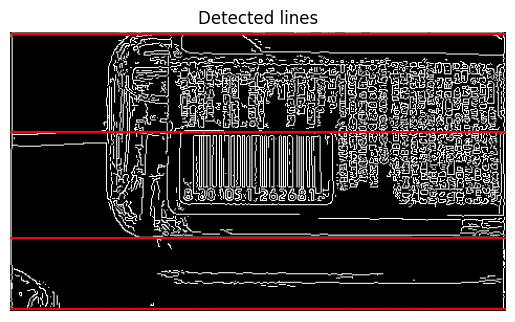

In [85]:
#Image 2
HoughDetector(imgs[1], .001,25,60)

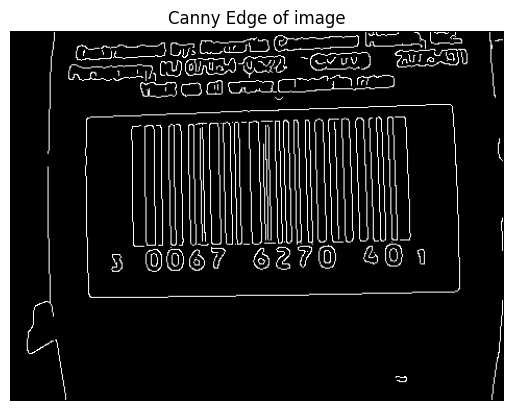

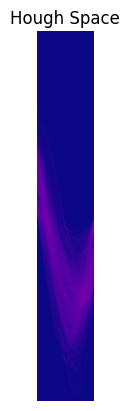

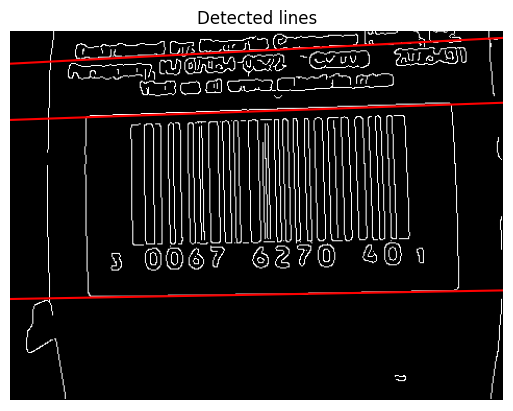

In [86]:
#Image 3
HoughDetector(imgs[2], 2,35,60)

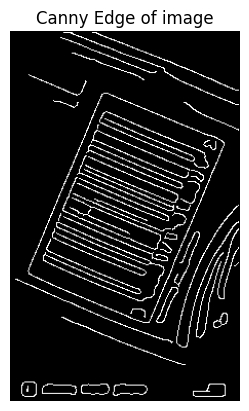

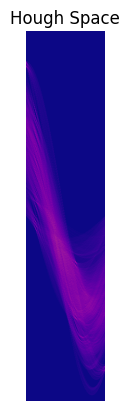

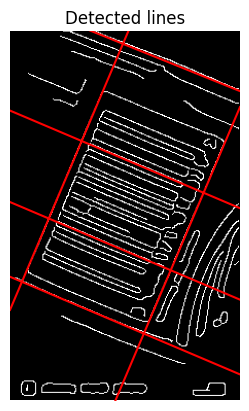

In [87]:
#Image 4
HoughDetector(imgs[3], 2.5,35,60)

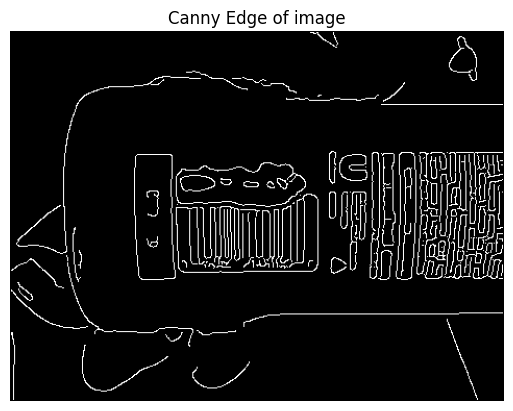

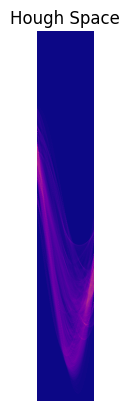

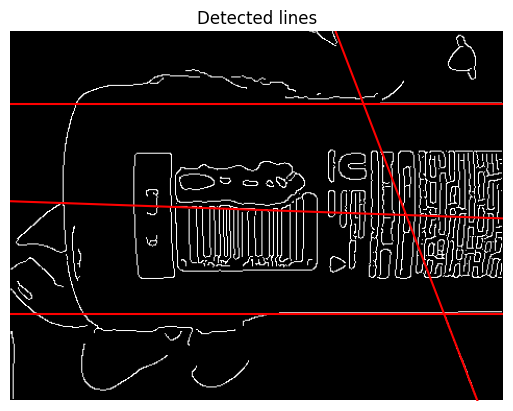

In [88]:
#Image 5
HoughDetector(imgs[4], 2,35,60)

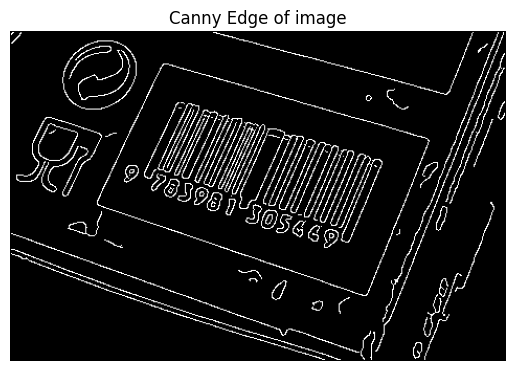

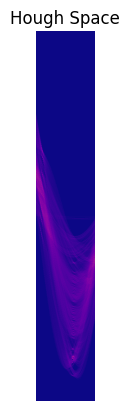

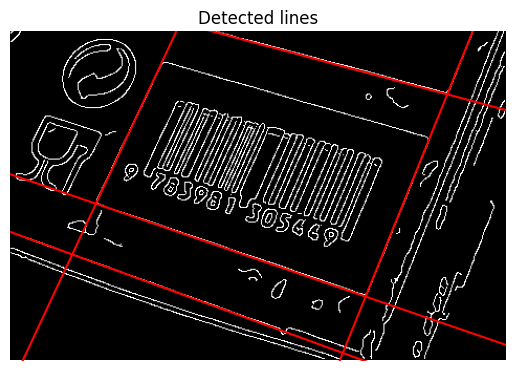

In [89]:
#Image 6
HoughDetector(imgs[5], 2,35,60)

Hough Space usually gets the general region without much changes between images. Overall combining these methods would be best as some work well with certain images and others not so much. By far the hardest image to detect using these methods was image 5, with sobel being the only one able to single it out. 